In [53]:
from ultralytics import YOLO
from PIL import Image
import os
import supervision as sv

In [78]:
MODEL_PATH = "models/"
IMAGE_PATH = "validate_images"
MODEL_VERSION = "v1"

In [81]:
model = YOLO(f"{MODEL_PATH}yolo11_{MODEL_VERSION}.pt")
image_files = [os.path.join(IMAGE_PATH, f) for f in os.listdir(IMAGE_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]

FileNotFoundError: [Errno 2] No such file or directory: 'modelsyolo11_v1.pt'

In [ ]:
images = [Image.open(image) for image in image_files]

results = [model.predict(image, conf=0.25)[0] for image in images]

# result.boxes.xyxy, result.boxes.conf, result.boxes.cls


0: 640x544 1 bottom, 1 coat, 94.8ms
Speed: 12.2ms preprocess, 94.8ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 544)

0: 640x544 1 coat, 3 tops, 73.6ms
Speed: 1.6ms preprocess, 73.6ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 544)

0: 640x640 1 bottom, 1 top, 86.5ms
Speed: 1.7ms preprocess, 86.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 top, 86.2ms
Speed: 1.5ms preprocess, 86.2ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x544 1 coat, 79.5ms
Speed: 1.4ms preprocess, 79.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 544)

0: 640x544 1 bottom, 2 tops, 71.5ms
Speed: 1.6ms preprocess, 71.5ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 544)

0: 640x544 1 coat, 2 tops, 72.3ms
Speed: 1.6ms preprocess, 72.3ms inference, 0.3ms postprocess per image at shape (1, 3, 640, 544)

0: 640x640 1 coat, 3 tops, 79.6ms
Speed: 1.9ms preprocess, 79.6ms inference, 0.3ms pos

In [65]:
detections = [sv.Detections.from_ultralytics(res) for res in results]
detections

[Detections(xyxy=array([[     225.57,      443.05,      449.67,      837.37],
        [     195.16,      110.13,      529.06,       654.6]], dtype=float32), mask=None, confidence=array([    0.91143,     0.80526], dtype=float32), class_id=array([0, 1]), tracker_id=None, data={'class_name': array(['bottom', 'coat'], dtype='<U6')}, metadata={}),
 Detections(xyxy=array([[     7.4828,      500.35,      338.68,      797.41],
        [     177.92,      61.884,      520.85,      801.92],
        [     361.63,       494.1,      690.31,       796.1],
        [     362.14,      499.46,      690.35,      797.54]], dtype=float32), mask=None, confidence=array([    0.69579,     0.53981,     0.39541,     0.34049], dtype=float32), class_id=array([2, 2, 1, 2]), tracker_id=None, data={'class_name': array(['top', 'top', 'coat', 'top'], dtype='<U4')}, metadata={}),
 Detections(xyxy=array([[     174.24,      539.07,      466.71,         700],
        [     145.15,      210.52,      563.44,      630.35]], dt

In [68]:
bounding_box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_images = []


for i in range(len(detections)):
    annotated_image = images[i].copy()  
    annotated_image = bounding_box_annotator.annotate(annotated_image, detections[i])
    annotated_image = label_annotator.annotate(annotated_image, detections[i])
    annotated_images.append(annotated_image) 


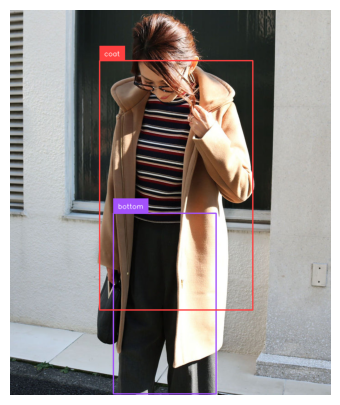

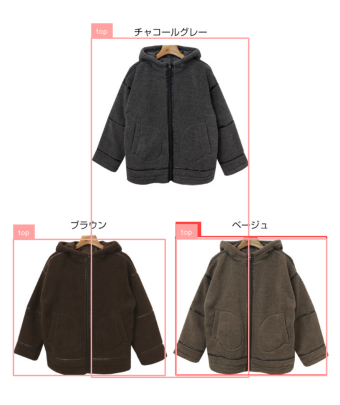

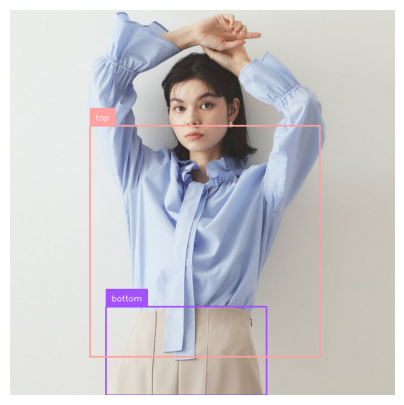

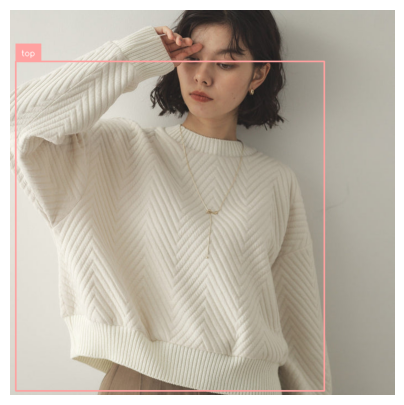

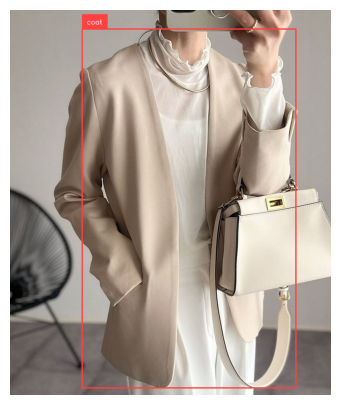

...

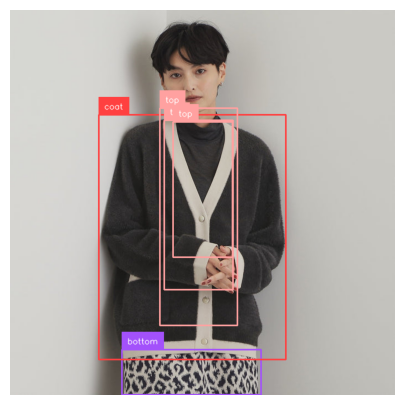

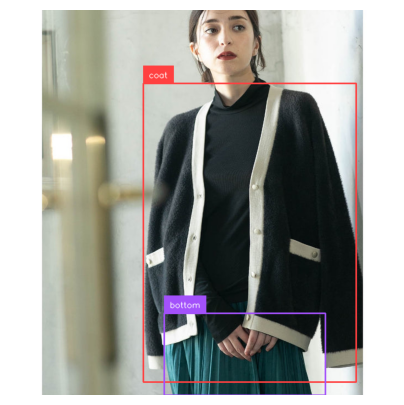

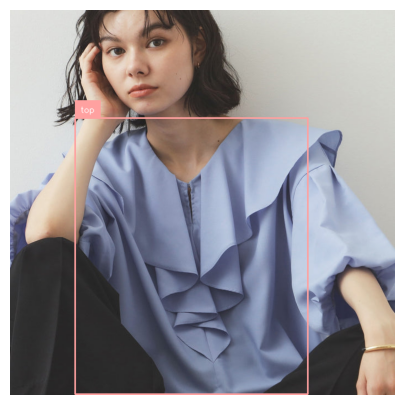

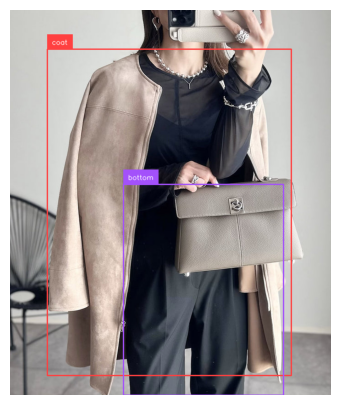

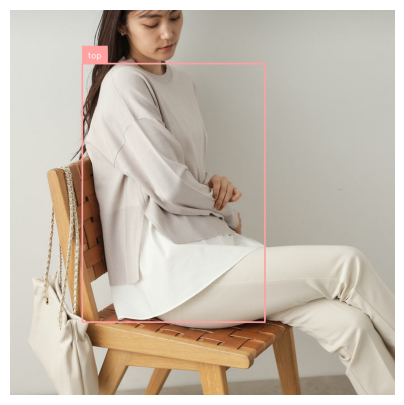

In [77]:
for img in annotated_images:
    sv.plot_image(img, size=(5, 5))